In [1]:
import PIL.Image
import numpy as np
from typing import Union
from glob import glob
import os

# [IAPR][iapr]: Project


**Group ID:** 15

**Author 1 (sciper):** Tom Mery (297217)  
**Author 2 (sciper):** Gabriel Margaria (299895)   
**Author 3 (sciper):** Théo Hermann (282844)   

**Release date:** 27.04.2023


## Important notes

The assignments are designed to teach practical implementation of the topics presented during class as well as preparation for the final project, which is a practical project which ties together the topics of the course. 

As such, in the lab assignments/final project, unless otherwise specified, you may, if you choose, use external functions from image processing/ML libraries like opencv and sklearn as long as there is sufficient explanation in the lab report. For example, you do not need to implement your own edge detector, etc.

**! Before handling back the notebook !** rerun the notebook from scratch `Kernel` > `Restart & Run All`


[iapr]: https://github.com/LTS5/iapr

---
## 0. Introduction

In this project, you will be working on solving tiling puzzles using image analysis and pattern recognition techniques. Tiling puzzles are a classic type of puzzle game that consists of fitting together pieces of a given shape (in this case squared to form a complete image. The goal of this project is to develop an algorithm that can automatically reconstruct tiling puzzles from a single input image. 

---

## 1. Data

### Input data
To achieve your task, you will be given images that look like this:


![train_00.png](data_project/project_description/train_00.png)

### Example puzzle content
Example of input of solved puzzles. 
Solution 1
<img src="data_project/project_description/solution_example.png" width="512"/>
Solution 2
<img src="data_project/project_description/solution_example2.jpg" width="512"/>


### 1.1. Image layout

- The input for the program will be a single image with a size of __2000x2000 pixels__, containing the pieces of the tiling puzzles randomly placed in it. The puzzles sizes vary from __3x3, 3x4, or 4x4__ size. 
    -__You are guaranteed to always have the exact number of pieces for each puzzle__ 
        -For each puzzle you always are expected to find exaclty 9,12,16 pieces
        -If you find something else, either you are missing pieces, or added incorrect pieces for the puzzle

- The puzzle pieces are square-shaped with dimensions of 128x128 pixels (before rotation). 

- The input image will contain pieces from __two or three (but never four)__ different tiling puzzles, as well as some __extra pieces (outliers)__ that do not belong to either puzzle.


## 2. Tasks (Total 20 points) 


The project aims to:
1) Segment the puzzle pieces from the background (recover the pieces of 128x128 pixels)   \[ __5 points__ \] 

2) Extract features of interest from puzzle pieces images \[ __5 points__ \]   

3) Cluster puzzle pieces to identify which puzzle they belong, and identify outliers.  \[ __5 points__ \]   

4) Solve tiling puzzle (find the rotations and translations to correctly allocate the puzzle pieces in a 3x3, 3x4 or 4x4 array.) \[ __5 points__ \]   

##### The images used for the puzzles have self-repeating patterns or textures, which ensures that all puzzle pieces contain more or less the same features regardless of how they were cut. 




### 1.2. Output solution pieces.

For each inpute image, the output solution will include N images with solved puzzles, where N is the number of puzzles in the input image. and M images, that are Each of these images will contain the solved solution to one of the N puzzles in the input. 


-  Example input:  train_05.png

- Example solution:
        -solution_05_00.png solution_05_01.png solution_05_02.png 
        -outlier_05_00.png outlier_05_01.png outlier_05_02.png ...

- Example input:  train_07.png
- Example solution:
        -solution_07_00.png solution_07_01.png 
        -outlier_07_00.png outlier_07_01.png outlier_07_02.png ...


__Watch out!__ output resolution should always be like this:  
<table ><tr><th >Puzzle pieces <th><th> pixel dimentions <th> <th> pixel dimentions <th> <tr>
<tr><td> 3x3 <td><td> 384x384 <td><td> 3(128)x3(128) <td> <tr>
<tr><td> 3x4 <td><td> 384x512 <td><td> 3(128)x4(128)<tr>
<tr><td> 4x4 <td><td> 512x512 <td><td> 4(128)x4(128)<tr>
<tr><td> 1x1 (outlier)<td><td> 128x128 <td><td> (1)128x(1)128 <td><tr><table>





__Order of the solutions (and rotations) it's not a problem for the grading__




the output solution will be a final image of resolution (1283)x(1283), with each piece correctly placed in its corresponding location in the 3x3 array. Similarly, if the puzzle consists of 3x4 or 4x4 pieces, the output solution will be an image of resolution (1283)x(1284) or (1284)x(1284)



### 1.3 Data folder Structure

You can download the data for the project here: [download data](https://drive.google.com/drive/folders/1k3xTH0ZhpqZb3xcZ6wsOSjLzxBNYabg3?usp=share_link)

```
data_project
│
└─── project_description
│    │    example_input.png      # example input images
│    │    example_textures1.png      # example input images
│    │    example_textures2.png      # example input images
│    └─── ultimate_test.jpg   # If it works on that image, you would probably end up with a good score
│
└─── train
│    │    train_00.png        # Train image 00
│    │    ...
│    │    train_16.png        # Train image 16
│    └─── train_labels.csv    # Ground truth of the train set
|    
└────train_solution
│    │    solution_00_00.png        # Solution puzzle 1 from Train image 00
│    │    solution_00_01.png        # Solution puzzle 2 from Train image 00
│    │    solution_00_02.png        # Solution Puzzle 3 from Train image 00
│    │    outlier_00_00.png         # outlier     from Train image 00
│    │    outlier_00_01.png         # outlier     from Train image 00
│    │    outlier_00_03.png         # outlier     from Train image 00
│    │    ...
│    │    solution_15_00.png        # Solution puzzle 1 from Train image 15
│    │    solution_15_01.png        # Solution puzzle 2 from Train image 15
│    │    outlier_15_00.png         # outlier     from Train image 15
│    └─── outlier_15_01.png         # outlier     from Train image 15
│
└─── test
     │    test_00.png         # Test image 00 (day of the exam only)
     │    ...
     └─── test_xx.png             # Test image xx (day of the exam only)
```



## 3. Evaluation

**Before the exam**
   - Create a zipped folder named **groupid_xx.zip** that you upload on moodle (xx being your group number).
   - Include a **runnable** code (Jupyter Notebook and external files) and your presentation in the zip folder.
   
**The day of the exam**
   - You will be given a **new folder** (test folder) with few images, but **no ground truth** (no solutions).
   - We will ask you to run your pipeline in **real time** and to send us your prediction of the task you obtain with the provided function **save_results**. 
   - On our side, we will compute the performance of your classification algorithm. 
   - To evaluate your method, we will use the **evaluate_solution** function presented below. To understand how the provided functions work, please read the documentation of the functions in **utils.py**.
   - **Please make sure your function returns the proper data format to avoid points penalty on the day of the exam**. 
---


## 4. Your code

In [2]:
## load images
import os 
from PIL import Image


import numpy as np
import matplotlib.pyplot as plt

In [3]:
def load_input_image(image_index ,  folder ="train" , path = "data_project"):
    
    filename = "train_{}.png".format(str(image_index).zfill(2))
    path_solution = os.path.join(path,folder , filename )
    
    im= Image.open(os.path.join(path,folder,filename)).convert('RGB')
    im = np.array(im)
    return im

def save_solution_puzzles(image_index , solved_puzzles, outliers  , folder ="train" , path = "data_project"  ,group_id = 0):
    
    path_solution = os.path.join(path,folder + "_solution_{}".format(str(group_id).zfill(2)))
    if not  os.path.isdir(path_solution):
        os.mkdir(path_solution)

    print(path_solution)
    for i, puzzle in enumerate(solved_puzzles):
        filename =os.path.join(path_solution, "solution_{}_{}.png".format(str(image_index).zfill(2), str(i).zfill(2)))
        Image.fromarray(puzzle).save(filename)

    for i , outlier in enumerate(outliers):
        filename =os.path.join(path_solution, "outlier_{}_{}.png".format(str(image_index).zfill(2), str(i).zfill(2)))
        Image.fromarray(outlier).save(filename)

In [4]:
def solve_and_export_puzzles_image(image_index , folder = "train" , path = "data_project"  , group_id = "00"):
    """
    Wrapper funciton to load image and save solution
            
    Parameters
    ----------
    image:
        index number of the dataset

    Returns
    """

      # open the image
    image_loaded = load_input_image(image_index , folder = folder , path = path)
    #print(image_loaded)
    
   
    ## call functions to solve image_loaded
    solved_puzzles = [ (np.random.rand(512,512,3)*255).astype(np.uint8)  for i in range(2) ]
    outlier_images = [ (np.random.rand(128,128,3)*255).astype(np.uint8) for i in range(3)]
    
    save_solution_puzzles (image_index , solved_puzzles , outlier_images , folder = folder ,group_id =group_id)
    
   
    
    
    
    return image_loaded , solved_puzzles , outlier_images

im, sol , out = solve_and_export_puzzles_image(6 , group_id = 6)

data_project/train_solution_06


In [5]:
group_id = 0
# Evaluate all images
games_id = [6,10]  # to evaluate  three images

for i in games_id :
    
    print("solving " , i)
    # Saving results
    solve_and_export_puzzles_image(6 , group_id = group_id)
  


solving  6
data_project/train_solution_00
solving  10
data_project/train_solution_00


## Evaluation metrics

The evaluation metrics will be liberated in the following days. 


## Gabor filters

$$ gb(x,y) = \exp \left( -\frac{1}{2} \left( \frac{x_{\theta}^2}{\sigma^2} + \frac{y_{\theta}^2}{(\Gamma\sigma)^2} \right) \right) \cos \left( \frac{2 \pi}{\lambda} x_{\theta} + \psi \right) $$


# Segmentation

In [6]:
import cv2
import numpy as np
import scipy
import skimage.morphology as morph
from skimage.filters import threshold_multiotsu


class Solution:
    def __init__(self, img_idx, mask=None, feature_map=None, valid_clusters=None, outliers=None, solved_puzzles=None):
        self.img_idx = img_idx
        self.mask = mask
        self.feature_map = feature_map
        self.valid_clusters = valid_clusters
        self.outliers = outliers
        self.solved_puzzles = solved_puzzles
    
    def export_solution(self):
        clusters=[self.valid_clusters, self.outliers]
        return self.img_idx,[self.mask, self.feature_map, self.clusters, self.solved_puzzles]


def segment(image):
    """
    Segments the puzzle pieces from the background of an input image.

    Args:
        image: A numpy array representing the input image.

    Returns:
        A binary image where the puzzle pieces are represented by 1 and the background is represented by 0.
    """
    kernel = np.array([[1, 1, 1], [1, -7, 1], [1, 1, 1]])
    sharpened_image = cv2.filter2D(image, -1, kernel)
    sharpened_image = cv2.cvtColor(sharpened_image, cv2.COLOR_BGR2GRAY)
    thresholded_bis = cv2.adaptiveThreshold(
    sharpened_image,
    maxValue=255,
    adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    thresholdType=cv2.THRESH_BINARY,
    blockSize=3,
    C=-4)

    thresholded_bis = morph.remove_small_holes(thresholded_bis.astype(bool), area_threshold=1000, connectivity=3).astype(np.uint8)
    
    thresholded_bis[thresholded_bis > 0] = 255
    # plt.figure(figsize=(10, 10))
    # plt.imshow(thresholded_bis, cmap='gray')
    # plt.show()
    
    
    # Binarize blurred image with non 0 values set to 255 and 0 values set to 0
    #closing on the thresholded image
    kernel = np.ones((9,9),np.uint8)
    thresholded_bis_closed = cv2.morphologyEx(thresholded_bis, cv2.MORPH_CLOSE, kernel)
    
    return thresholded_bis_closed.astype(np.uint8)



def get_rectangles(img, segmented, height=128, width=128):
    # Find contours
    contours = cv2.findContours(segmented, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = contours[0] if len(contours) == 2 else contours[1]

    target_area = height*width
    max_err = 0.15     # + ou - 15%

    # Compute rotated rectangle (minimum area)
    rectangles = []
    angles = []
    mask = np.zeros_like(img)
    for cnt in contours:
        rect = cv2.minAreaRect(cnt)
        box = cv2.boxPoints(rect)
        area = cv2.contourArea(box)
        if (area > (1-max_err)*target_area) and (area < (1+max_err)*target_area): 
            rectangles.append(rect)
            cv2.drawContours(mask, [box.astype(int)], 0, (255, 255, 255), thickness=cv2.FILLED)
    
    return rectangles, mask


def rotate_image(image, angle):
    (h, w) = image.shape[:2]
    diag = int(np.ceil(np.sqrt(h**2 + w**2)))
    
    padded = np.zeros((diag, diag, 3), dtype=image.dtype)
    
    yoff = round((diag-h)/2)
    xoff = round((diag-w)/2)
    padded[yoff:yoff+h, xoff:xoff+w, :] = image.copy()
    
    center = (diag / 2, diag / 2)
    M = cv2.getRotationMatrix2D(center,angle,1.0)
    rotated_image = cv2.warpAffine(padded, M, (diag,diag))
    return rotated_image


def crop_image(image, rect):
    box = np.int0(cv2.boxPoints(rect))
    x_min, y_min = np.min(box, axis=0)
    x_max, y_max = np.max(box, axis=0)
    x1 = max(0, x_min)
    y1 = max(0, y_min)
    x2 = min(image.shape[1], x_max)
    y2 = min(image.shape[0], y_max)
    cropped = image[y1:y2, x1:x2]
    return cropped


class Piece:
    def __init__(self, data):
        self.data = data
    
    def rotate(self):
        raise NotImplementedError
    
    def translate(self):
        raise NotImplementedError


def get_piece(image, rect, height=128, width=128):
    # Crop image 
    data = crop_image(image, rect)
    
    # Rotate piece
    angle = rect[2]
    data = rotate_image(data, angle)
    
    # Crop rotated piece
    center = (int(data.shape[0]/2), int(data.shape[1]/2))
    x1 = center[1] - int(width/2)
    y1 = center[0] - int(height/2)
    x2 = center[1] + int(width/2)
    y2 = center[0] + int(height/2)
    data = data[y1:y2, x1:x2]
    
    piece = Piece(data=data)

    return piece

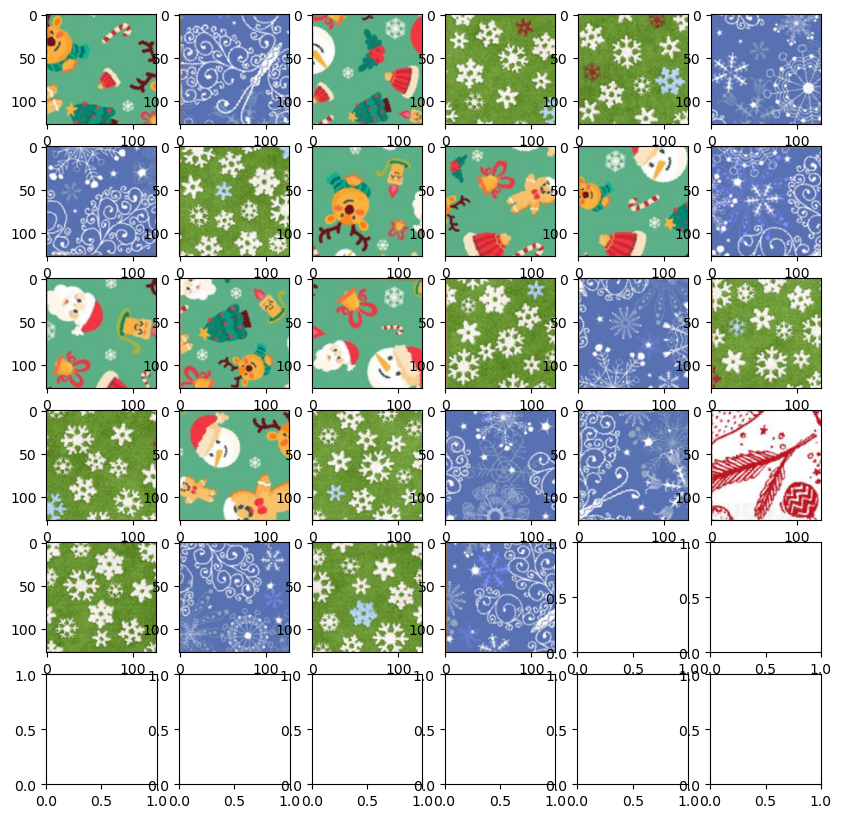

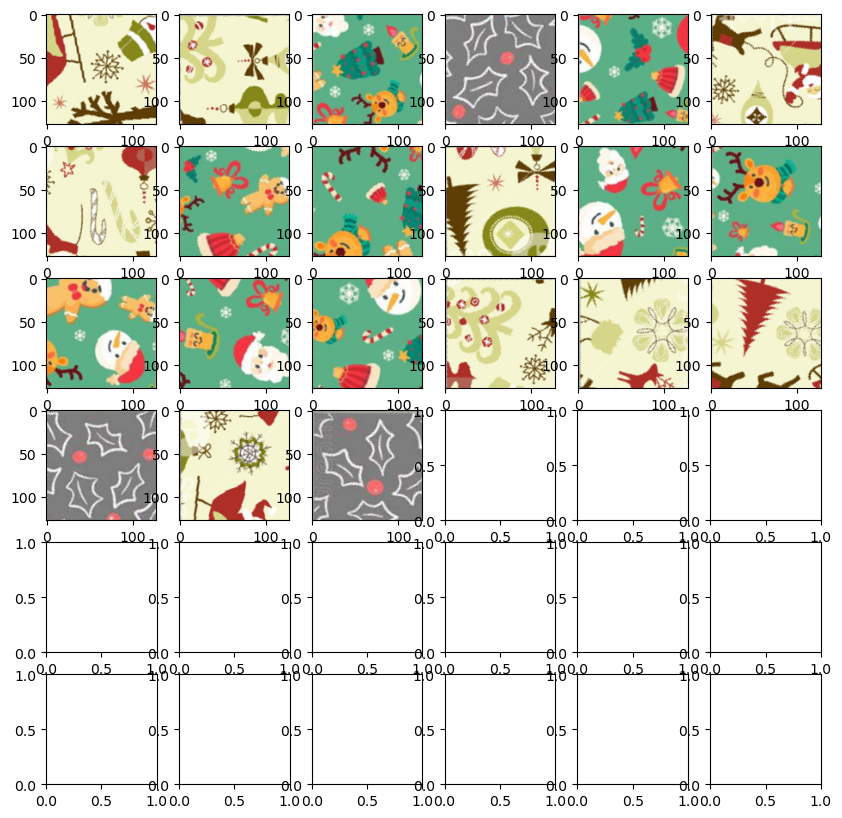

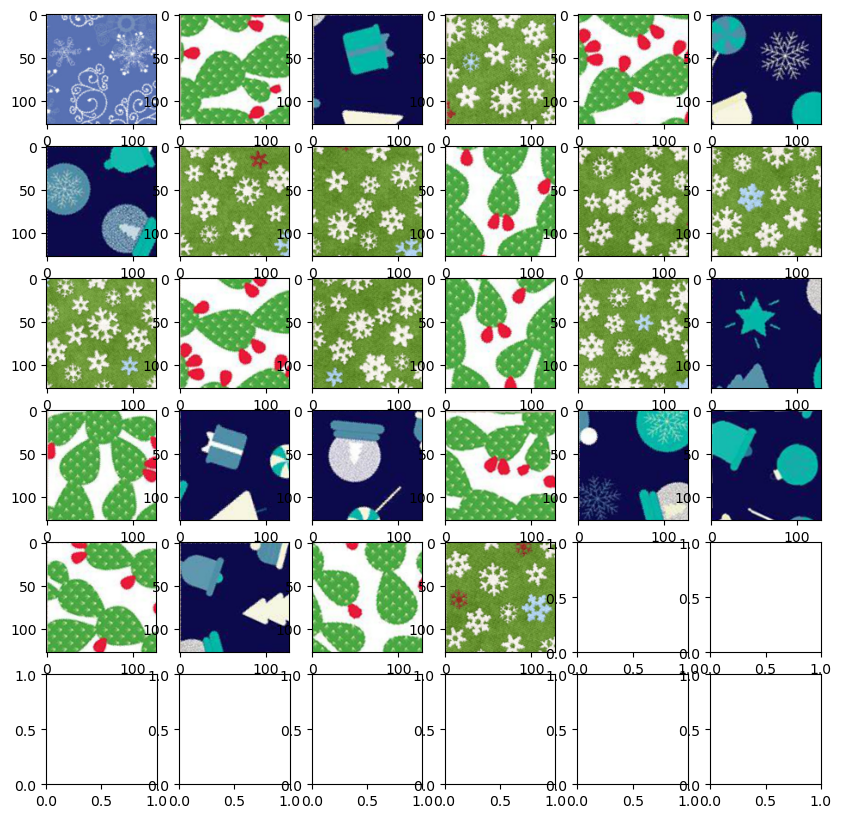

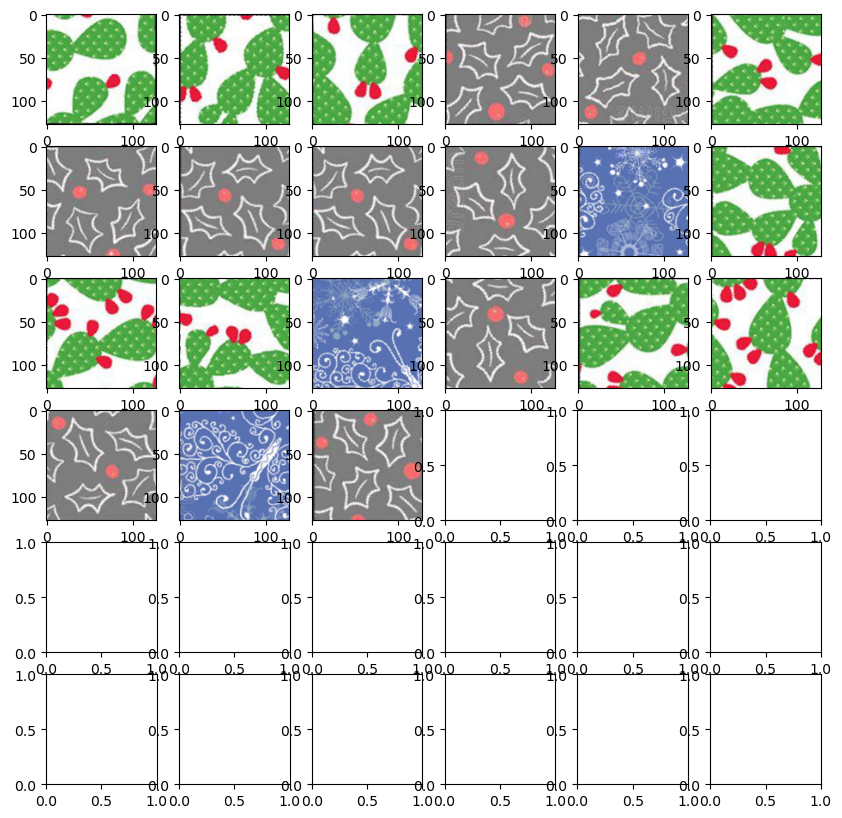

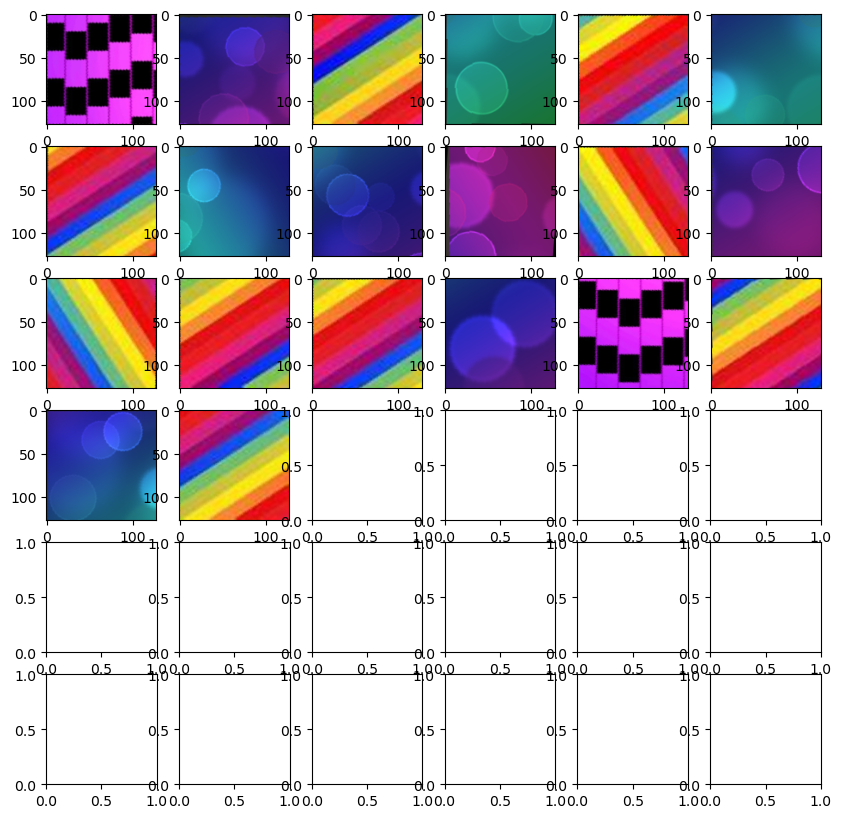

...

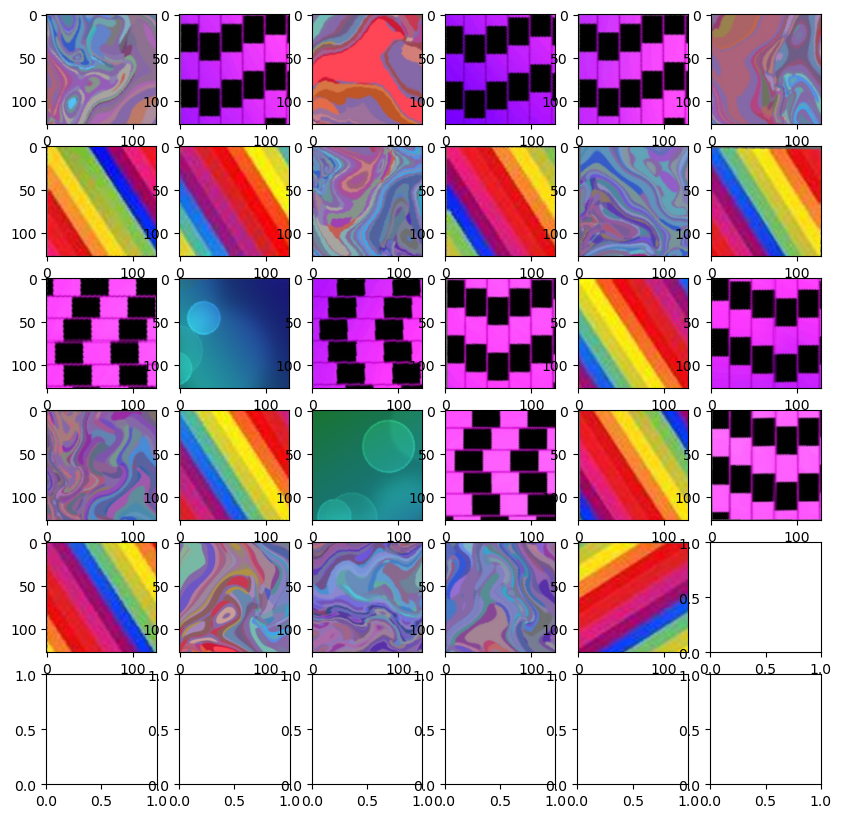

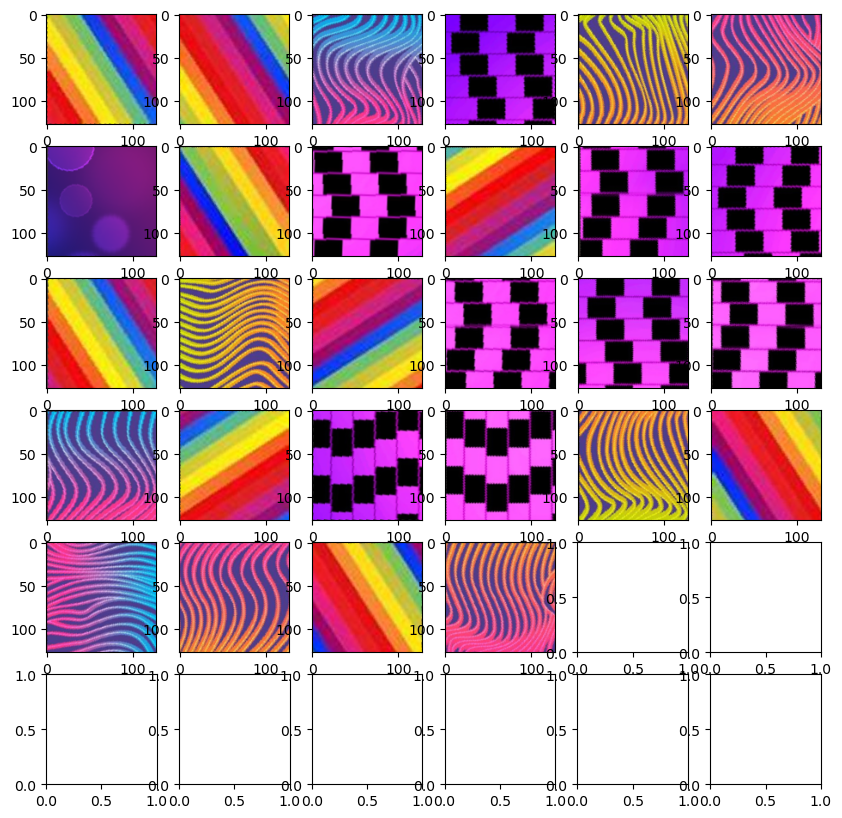

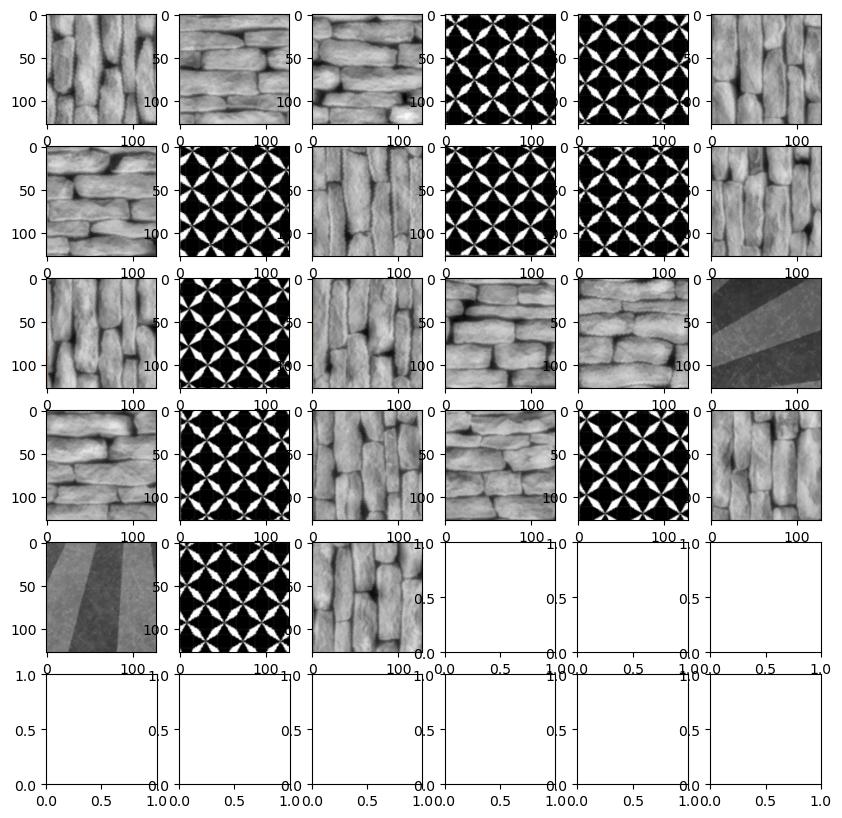

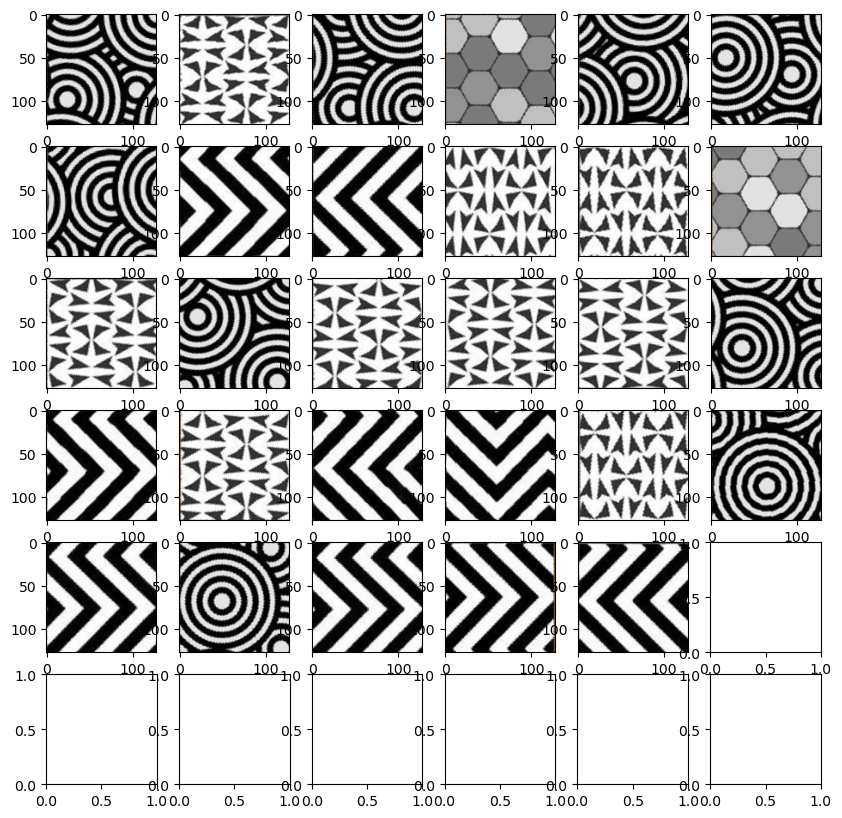

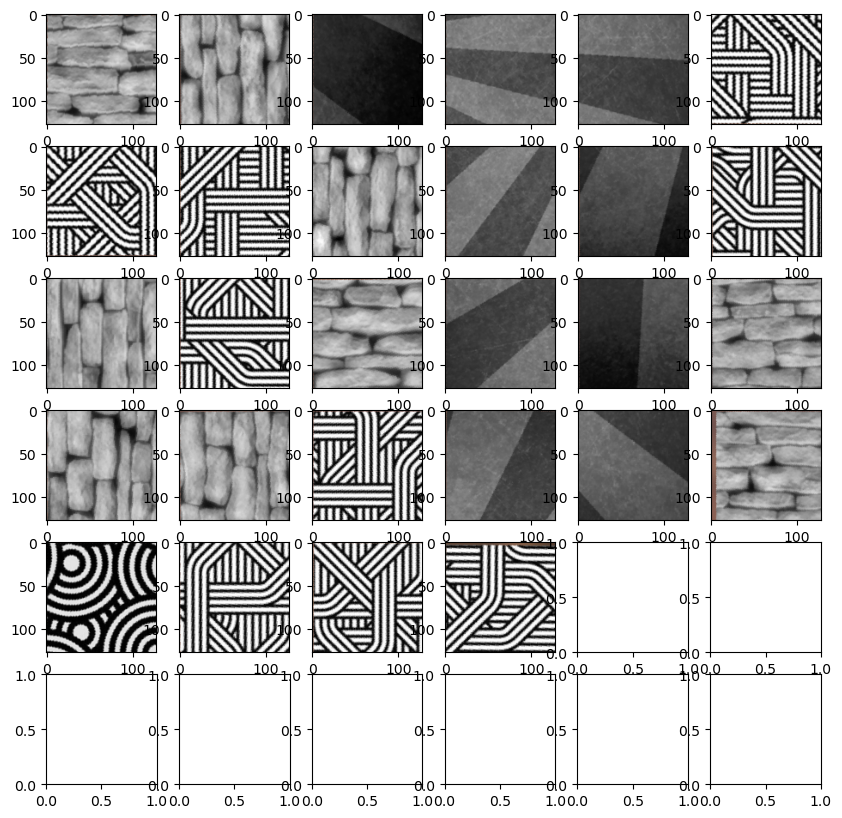

In [7]:
# Load image, grayscale, Gaussian blur, Otsu's threshold
list_of_pieces = [] 
Solutions = []
for i in range(11):
    image = load_input_image(image_index=i)
    segmented_bis = segment(image)
    rectangles_bis, mask = get_rectangles(image, segmented_bis)
    Solutions.append(Solution(i, mask=mask))
    # plt.imshow(image)
    # plt.title('Original image bis mask')
    # plt.show()

    
    pieces = []
    for rect in rectangles_bis:
        pieces.append(get_piece(image, rect))
    list_of_pieces.append(pieces)
    fig, axs = plt.subplots(6, 6, figsize=(10,10))
    axs = axs.ravel()

    for i, piece in enumerate(pieces):
        axs[i].imshow(piece.data)
    
    
    


# Feature extraction

In [8]:
#switch between Gabor + Histogram and Pretrained Neural Net Features
USE_GABOR=True

In [9]:
from skimage.filters import gabor
from scipy.stats import kurtosis, skew
from skimage.feature import local_binary_pattern
from skimage.feature import canny
from scipy.stats import entropy


#def extract_gabor_features(image, orientations=8, scales=(1, 3, 5, 7), lambdas=np.arange(0.001, np.pi, np.pi / 4), gammas=(0.05, 0.5)):
epsylon=0.001
def extract_gabor_features(image, orientations=4, blur=False, scales=(3, 5), lambdas=np.arange(epsylon, np.pi+epsylon, np.pi / 2), gammas=([0.1])):
    """
    Extract Gabor features from an image using Gabor filters.
    
    Parameters:
        - image: Input image for feature extraction.
        - orientations: Number of orientations for the Gabor filters.
        - scales: Scales of the Gabor filters.
        - lambdas: Spatial frequencies (wavelengths) of the Gabor filters.
        - gammas: Spatial aspect ratios of the Gabor filters.
    
    Returns:
        - features: Extracted Gabor features as a 1D numpy array.
    """
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY).astype(np.float64)

    if blur:
        gray = cv2.GaussianBlur(gray, (5, 5), 0)

    feature_lists = []
    
    for theta in range(orientations):
        theta_radians = theta / orientations * np.pi
        for sigma in scales:
            for lambd in lambdas:
                for gamma in gammas:
                    try:
                        # Create the Gabor kernel
                        kernel_real, kernel_imag = gabor(gray, frequency=1/lambd, theta=theta_radians, sigma_x=sigma, sigma_y=sigma)
                    
                        # Apply the Gabor filter to the image and get the filtered response
                        filtered = np.abs(cv2.filter2D(gray, cv2.CV_64F, kernel_real))  # Magnitude response
                        
                        # Calculate statistical measures from the filtered response
                        #mean = np.mean(filtered)
                        #std = np.std(filtered)
                        #skewness = skew(filtered.flatten())
                        #kurt=kurtosis(filtered.flatten())
                        energy = np.sum(filtered**2)
                        ent=entropy(filtered.flatten())
                        feature_lists.append([ent, energy])
                        # Append the features to the corresponding feature list
                        #feature_lists.append([mean, std, skewness])
                        
                    except (ZeroDivisionError, ValueError, RuntimeWarning) as e:
                        # Handle the specific error or warning here
                        # For example, you can skip the iteration or assign a default value
                        print("Error encountered with parameters:")
                        print("Theta:", theta)
                        print("Sigma:", sigma)
                        print("Lambda:", lambd)
                        print("Gamma:", gamma)
                        print("Error message:", str(e))
    
    # Concatenate the feature lists into a single feature vector
    features = np.concatenate(feature_lists)
    
    # Normalize the feature vector
    features /= np.max(features)
    return features

def extract_histogram_features(image, color_space='RGB', normalize='total', preprocessing_method=None):
    if preprocessing_method is not None:
        # Apply the selected preprocessing method
        if preprocessing_method == 'denoise':
            # Apply denoising using cv2.fastNlMeansDenoisingColored()
            image = cv2.fastNlMeansDenoisingColored(image, None, 10, 10, 7, 21)
        elif preprocessing_method == 'equalize':
            # Apply histogram equalization using cv2.equalizeHist()
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            image = cv2.equalizeHist(image)
        elif preprocessing_method == 'blur':
            # Apply Gaussian blur using cv2.GaussianBlur()
            image = cv2.GaussianBlur(image, (5, 5), 0)
        else:
            raise ValueError('Invalid preprocessing method')    
    if color_space == 'RGB':
        # Split RGB channels
        r, g, b = cv2.split(image)
        # Compute the histogram for each RGB channel
        hist_r = np.histogram(r.ravel(), bins=256, range=(0, 255))[0]
        hist_g = np.histogram(g.ravel(), bins=256, range=(0, 255))[0]
        hist_b = np.histogram(b.ravel(), bins=256, range=(0, 255))[0]
        
        # Concatenate the histograms to create a feature vector
        hist = np.concatenate([hist_r, hist_g, hist_b])
    elif color_space == 'LAB':
        # Convert to LAB color space
        lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        
        # Split LAB channels
        l, a, b = cv2.split(lab_image)
        
        # Compute the histogram for each LAB channel
        hist_l = np.histogram(l.ravel(), bins=256, range=(0, 255))[0]
        hist_a = np.histogram(a.ravel(), bins=256, range=(0, 255))[0]
        hist_b = np.histogram(b.ravel(), bins=256, range=(0, 255))[0]
        
        # Concatenate the histograms to create a feature vector
        hist = np.concatenate([hist_l, hist_a, hist_b])
    elif color_space == 'HSV':
        # Convert to HSV color space
        hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        
        # Split HSV channels
        h, s, v = cv2.split(hsv_image)
        
        # Compute the histogram for each HSV channel
        hist_h = np.histogram(h.ravel(), bins=256, range=(0, 255))[0]
        hist_s = np.histogram(s.ravel(), bins=256, range=(0, 255))[0]
        hist_v = np.histogram(v.ravel(), bins=256, range=(0, 255))[0]
        
        # Concatenate the histograms to create a feature vector
        hist = np.concatenate([hist_h, hist_s, hist_v])

    # Normalize the histograms
    if normalize == 'individual':
        # Normalize each channel individually
        if color_space == 'RGB':
            hist_r = hist_r / np.sum(hist_r)
            hist_g = hist_g / np.sum(hist_g)
            hist_b = hist_b / np.sum(hist_b)
            hist_normalized = np.concatenate([hist_r, hist_g, hist_b])
        elif color_space == 'LAB':
            hist_l = hist_l / np.sum(hist_l)
            hist_a = hist_a / np.sum(hist_a)
            hist_b = hist_b / np.sum(hist_b)
            hist_normalized = np.concatenate([hist_l, hist_a, hist_b])
        elif color_space == 'HSV':
            hist_h = hist_h / np.sum(hist_h)
            hist_s = hist_s / np.sum(hist_s)
            hist_v = hist_v / np.sum(hist_v)
            hist_normalized = np.concatenate([hist_h, hist_s, hist_v])

    else:
        # Normalize the concatenated histogram
        hist_normalized = hist / np.sum(hist)

    return hist_normalized

def extract_lbp_features(image, use_canny=True, radius=3, n_points=8):
    """
    Extract Local Binary Patterns (LBP) features from an image.
    
    Parameters:
        - image: Input image for feature extraction.
        - radius: Radius of the circular neighborhood around each pixel.
        - n_points: Number of sampling points to use in the circular neighborhood.
    
    Returns:
        - features: Extracted LBP features as a 1D numpy array.
    """
    # Convert the image to gray-scale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    if use_canny:
        preprocessed_img = canny(gray)
    else:
        preprocessed_img = gray
    # Extract LBP features
    lbp = local_binary_pattern(preprocessed_img, n_points, radius, method='uniform')
    
    # Calculate the histogram of LBP values
    hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, n_points + 3), range=(0, n_points + 2))
    
    # Normalize the histogram
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-7)
    
    # Flatten the histogram and return as features
    features = hist.flatten()
    
    return features

def check_has_nan(array):
    # Check if the array contains NaN values
    has_nan = np.isnan(array).any()
    if has_nan:
        return True
    else:
        return False
    
def extract_feature_classic(image, use_gabor=True, use_lbp=False):
    if use_gabor:
        gabor_feat=np.array(extract_gabor_features(image))
        #print(f"gabor: {gabor_feat.shape}")
        if check_has_nan(gabor_feat):
            print("piece has nan in gabor")
    hist_feat=np.array(extract_histogram_features(image))
    #print(f"hist: {hist_feat.shape}")
    if check_has_nan(hist_feat):
        print("piece has nan in hist")

    if use_lbp:
        lbp_feat=np.array(extract_lbp_features(image))
        #print(f"lbp: {lbp_feat.shape}")
        if check_has_nan(lbp_feat):
            print("piece has nan in lbp")
    if use_gabor and use_lbp:
        full_feat=np.concatenate((gabor_feat,hist_feat,lbp_feat))
    elif not use_gabor and use_lbp:
        full_feat=np.concatenate((hist_feat,lbp_feat))
    else:
        full_feat=np.concatenate((gabor_feat,hist_feat))
    #print(full_feat.shape)
    return full_feat


In [10]:

# from keras.applications import EfficientNetB0
# piece_shape=(128,128,3)
# model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(piece_shape))


In [11]:
#Feature Extraction on all images in order to tune the Clustering (/!\ takes a lot of time)
list_of_features = []
for i, pieces in enumerate(list_of_pieces):
    features = []
    for piece in pieces:
        if USE_GABOR:
            feature=extract_feature_classic(piece.data, use_gabor=True, use_lbp=True)
        else:
            feature=model.predict(np.expand_dims(piece.data, axis=0))
        features.append(feature)

    print(len(pieces))
    features=np.array(features)
    print(np.array(features).shape)
    if not USE_GABOR:
        #flatten the features as the output of NN is 4x4x1280
        features = np.reshape(features, (features.shape[0], -1))
        print(np.array(features).shape)
    list_of_features.append(features)
    ### Save the Feature Map of Dimension NxM where N is the number of pieces and M is the number of features
    Solutions[i].feature_map = features

list_of_features=np.array(list_of_features)
print(list_of_features.shape)

28
(28, 810)
21
(21, 810)
28
(28, 810)
21
(21, 810)
20
(20, 810)
28
(28, 810)
29
(29, 810)
28
(28, 810)
27
(27, 810)
29
(29, 810)
28
(28, 810)
(11,)


/var/folders/y_/y88txvzd6wn04_qgbshn3ct80000gn/T/ipykernel_54080/2473131669.py:23: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  list_of_features=np.array(list_of_features)


# Clustering

In [17]:
USE_DBSCAN=True #Otherwise use KMeans for clustering

In [18]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans, DBSCAN
from scipy.spatial import distance

def cluster_puzzle_pieces(features, k):
    # Perform k-means clustering on the features
    kmeans = KMeans(n_clusters=k, random_state=0).fit(features)
    
    # Get the cluster labels and centroids
    labels = kmeans.labels_
    
    return labels

def outliers_k_means(labels, num_outliers_max=3):
    # Outlier detection based on smaller cluster size
    # Count the occurrences of each cluster
    cluster_counts = np.bincount(labels)
    cluster_list=np.arange(len(cluster_counts))
    # Find the index of the cluster with the least occurrences
    if cluster_counts[np.argmin(cluster_counts)] <= num_outliers_max: 
        outlier_cluster = np.argmin(cluster_counts)
        #replace outlier label by -1
        labels[labels==outlier_cluster]=-1
    else:
        outlier_cluster = None

    valid_cluster_list=cluster_list[cluster_list!=outlier_cluster]
    return labels

def cluster_features(features, max_clusters, use_dbscan=False, dbscan_eps=0.5, dbscan_min_samples=5):
    """
    Cluster the given features using K-means or DBSCAN algorithm with the optimal number of clusters determined by the Silhouette Score.
    
    Parameters:
        - features: Feature matrix with shape (num_samples, num_features).
        - max_clusters: Maximum number of clusters to consider.
        - use_dbscan: Flag to indicate whether to use DBSCAN algorithm for clustering.
        - dbscan_eps: The maximum distance between two samples for them to be considered as neighbors in DBSCAN.
        - dbscan_min_samples: The minimum number of samples in a neighborhood for a point to be considered as a core point in DBSCAN.
    
    Returns:
        - labels: Cluster labels for each sample.
    """
    
    silhouette_scores = []
    
    if use_dbscan:
        # Perform DBSCAN clustering
        dbscan = DBSCAN(eps=dbscan_eps, min_samples=dbscan_min_samples)
        labels = dbscan.fit_predict(features)
    else:
        # Perform K-means clustering for different number of clusters
        for num_clusters in range(2, max_clusters+1):
            kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=42)
            labels = kmeans.fit_predict(features)
            silhouette_scores.append(silhouette_score(features, labels))
    
        # Determine the optimal number of clusters based on the Silhouette Score
        optimal_num_clusters = 2 + silhouette_scores.index(max(silhouette_scores))
        
        # Perform K-means clustering with the optimal number of clusters
        kmeans = KMeans(n_clusters=optimal_num_clusters, n_init=10, random_state=42)
        labels = kmeans.fit(features).labels_
        labels=outliers_k_means(labels)
    
    return labels

def remove_false_outliers(labels, max_num_outliers=3):
    # Count the number of outliers in the outlier cluster
    outlier_indices = np.where(labels == -1)[0]
    #print(outlier_indices)
    num_outliers = outlier_indices.shape[0]
    #print(num_outliers)

    # If the number of outliers exceeds the maximum, remove the outlier cluster
    if num_outliers > max_num_outliers:
        
        # # Remove the outlier cluster from the labels and outliers arrays
        # labels = np.delete(labels, outlier_indices)
        # outliers = np.delete(outliers, outlier_indices)

        # Create a new cluster for the removed outlier points
        new_cluster_index = np.max(labels) + 1
        labels[outlier_indices] = new_cluster_index
        #print(labels)
    return labels

def detect_outlier_cluster(labels, acceptable_sizes=(9,12,16), max_num_outliers=3):
    #check that there is not an outlier cluster
    unique_labels=np.unique(labels)
    if -1 not in unique_labels:
        #get the size of the clusters
        cluster_sizes=[]
        for label in unique_labels:
            cluster_pts_idx = np.where(labels == label)[0]
            cluster_size = cluster_pts_idx.shape[0]
            cluster_sizes.append(cluster_size)
        #print(cluster_sizes)
        #check if there is only one cluster with size not in acceptable_size
        # Count the number of clusters with acceptable sizes
        count_acceptable_sizes = sum(size in acceptable_sizes for size in cluster_sizes)

        if count_acceptable_sizes == len(cluster_sizes) - 1:
            print("There is only one cluster that doesn't have the acceptable size.")
            # Find the index of the cluster that doesn't have the acceptable size
            outlier_cluster_index=[index for index, size in enumerate(cluster_sizes) if size not in acceptable_sizes]
            #outlier_cluster_index = np.where(cluster_sizes not in acceptable_sizes)[0][0]
            print(outlier_cluster_index)
            # Find the index of the outlier cluster in the labels array
            outlier_cluster_label = unique_labels[outlier_cluster_index]
            #replace the labels to -1 for the outlier cluster
            labels[labels==outlier_cluster_label]=-1
        else:
            print("There are multiple clusters that don't have the acceptable size.")
    return labels

def check_outlier_cluster(labels, max_num_outliers=3):
    #First move false outliers to a valid cluster
    remove_false_outliers(labels)
    print(f"labels after removing false outliers: {labels}")
    detect_outlier_cluster(labels)
    print(f"labels after detecting outlier cluster: {labels}")
    return labels

#assemble the clusters with acceptable sizes
def combine_clusters(labels, acceptable_sizes=(9, 12, 16)):
    unique_labels=np.unique(labels)
    #remove the outlier cluster
    unique_labels=unique_labels[unique_labels!=-1]
    # iterate over the clusters
    for i, label in enumerate(unique_labels):
        # Check if the cluster size is acceptable
        #print(label)
        #get the points of the cluster
        cluster_pts_idx = np.where(labels == label)[0]
        #print(cluster_pts_idx)
        cluster_size = cluster_pts_idx.shape[0]
        if cluster_size < min(acceptable_sizes):
            # check if combining with another cluster can reach an acceptable size
            for j, label2 in enumerate(np.unique(labels)):
                if j == i:
                    # skip the current cluster
                    continue
                else:
                    other_cluster_pts_idx = np.where(labels == label2)[0]
                    other_cluster_size = other_cluster_pts_idx.shape[0]
                    combined_size = cluster_size + other_cluster_size
                    if combined_size in acceptable_sizes:
                        # combine the clusters
                        #print(f"combining cluster {i} with cluster {j}")
                        labels[other_cluster_pts_idx] = label
    #print(labels)
    return labels


#cluster size acceptable +1 => move the one further to centroid as outlier

#separate a cluster mixing 2 and therefore having size acceptable_size*2
def separate_mixed_cluster(features, labels, acceptable_sizes=(9, 12, 16)):
    # get all possible combinations sizes of acceptable sizes
    combinations_sizes=[]
    for i in acceptable_sizes:
        for j in acceptable_sizes:
            combinations_sizes.append(i+j)
    combinations_sizes=np.unique(combinations_sizes)
    print(combinations_sizes)
    unique_labels=np.unique(labels)
    #remove the outlier cluster
    unique_labels=unique_labels[unique_labels!=-1]
    #iterate over the clusters
    for i, label in enumerate(np.unique(labels)):
        #check if cluster size is in combinations_sizes
        cluster_pts_idx = np.where(labels == label)[0]
        cluster_size = cluster_pts_idx.shape[0]
        if cluster_size in combinations_sizes:
            print(f"cluster {i} has size {cluster_size} and is a mix of 2 clusters")
            cluster_pts=features[cluster_pts_idx]
            # use kmeans to separate the cluster into 2 clusters
            kmeans = KMeans(n_clusters=2, n_init=10, random_state=42)
            labels2 = kmeans.fit_predict(cluster_pts)
            print(labels2)
            #modify labels 2 so that we create a new cluster label
            labels2=labels2+np.max(labels)+1
            #update labels 
            labels[cluster_pts_idx]=labels2
            print(f"updated labels: {labels}")
    return labels

#move a cluster with low number as outlier

#combine all manual manipulations
def manual_manip(features, labels):
    labels=check_outlier_cluster(labels, max_num_outliers=3)
    labels=combine_clusters(labels, acceptable_sizes=(9, 12, 16))
    print(labels)
    labels=separate_mixed_cluster(features, labels, acceptable_sizes=(9, 12, 16))
    return labels
    


In [19]:
if USE_GABOR:
    #default parameters
    # dbscan_eps=0.1
    # dbscan_min_samples=5
    #for image 5
    # dbscan_eps=0.18
    # dbscan_min_samples=3
    #params 30/05
    dbscan_eps=0.09
    dbscan_min_samples=2
    #params without gabor
    # dbscan_eps=0.10
    # dbscan_min_samples=2
else:
    #need to tune the dbscan parameters to work with the NN features
    dbscan_eps=80
    dbscan_min_samples=3

list_of_labels = []
for k, features in enumerate(list_of_features):
    labels = cluster_features(features, max_clusters=4, use_dbscan=USE_DBSCAN, dbscan_eps=dbscan_eps, dbscan_min_samples=dbscan_min_samples)
    labels=manual_manip(features, labels)
    print(labels)
    pieces=list_of_pieces[k]
    for i, label in enumerate(labels):
        pieces[i].label = label
    list_of_labels.append(labels)

labels after removing false outliers: [ 0  1  0  2  2  1  1  2  0  0  0  1  0  0  0  2  1  2  2  0  2  1  1 -1
  2  1  2  1]
labels after detecting outlier cluster: [ 0  1  0  2  2  1  1  2  0  0  0  1  0  0  0  2  1  2  2  0  2  1  1 -1
  2  1  2  1]
[ 0  1  0  2  2  1  1  2  0  0  0  1  0  0  0  2  1  2  2  0  2  1  1 -1
  2  1  2  1]
[18 21 24 25 28 32]
[ 0  1  0  2  2  1  1  2  0  0  0  1  0  0  0  2  1  2  2  0  2  1  1 -1
  2  1  2  1]
labels after removing false outliers: [0 0 1 2 1 0 0 1 1 0 1 1 1 1 1 0 0 0 2 0 2]
There is only one cluster that doesn't have the acceptable size.
[2]
labels after detecting outlier cluster: [ 0  0  1 -1  1  0  0  1  1  0  1  1  1  1  1  0  0  0 -1  0 -1]
[ 0  0  1 -1  1  0  0  1  1  0  1  1  1  1  1  0  0  0 -1  0 -1]
[18 21 24 25 28 32]
[ 0  0  1 -1  1  0  0  1  1  0  1  1  1  1  1  0  0  0 -1  0 -1]
labels after removing false outliers: [-1  0  1  0  0  2  2  0  0  0  0  0  0  0  0  0  0  1  0  1  1  0  2  1
  0  1  0  0]
labels after detecting 

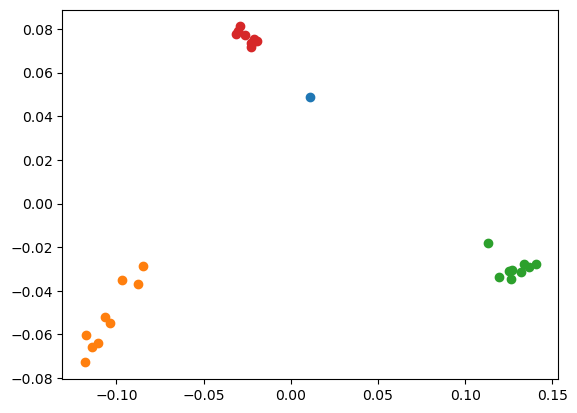

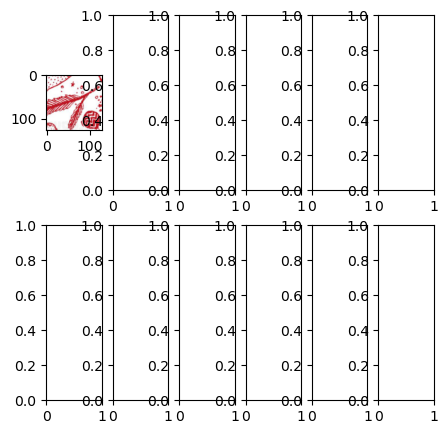

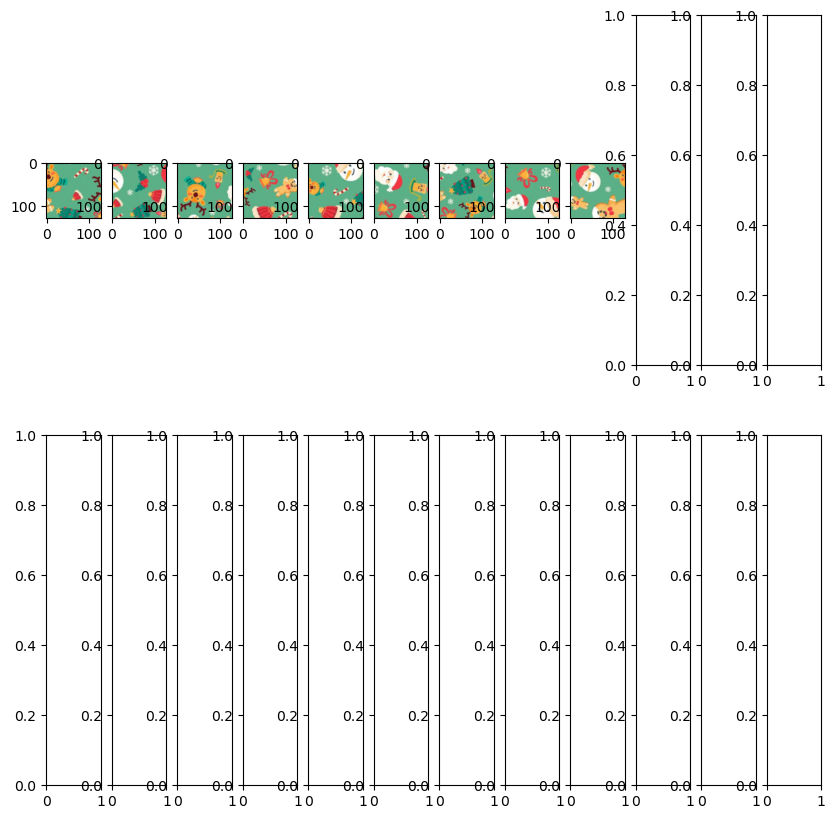

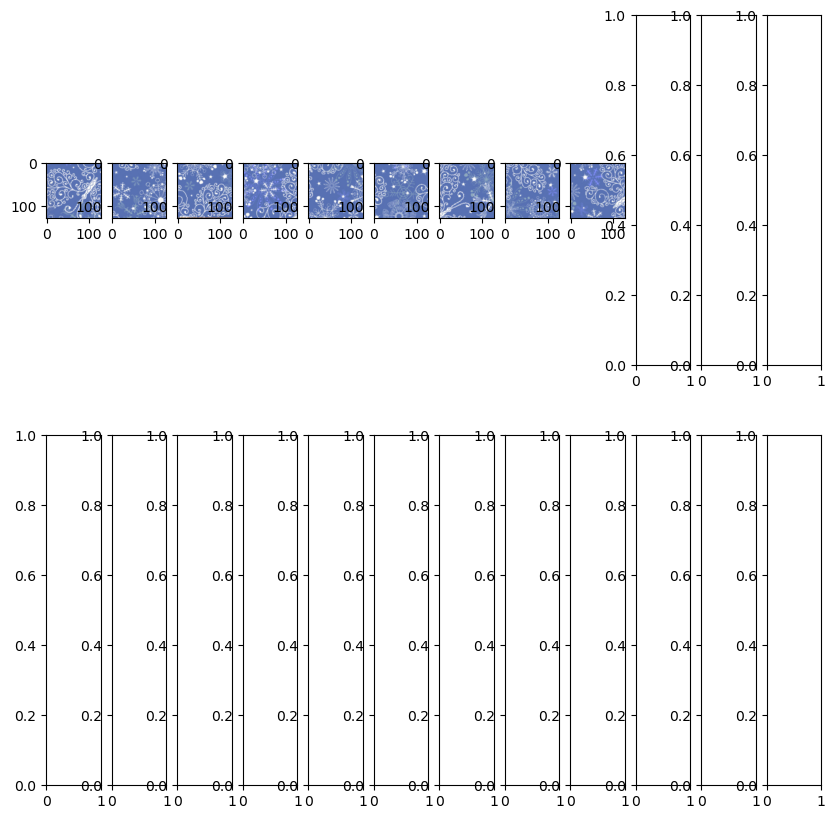

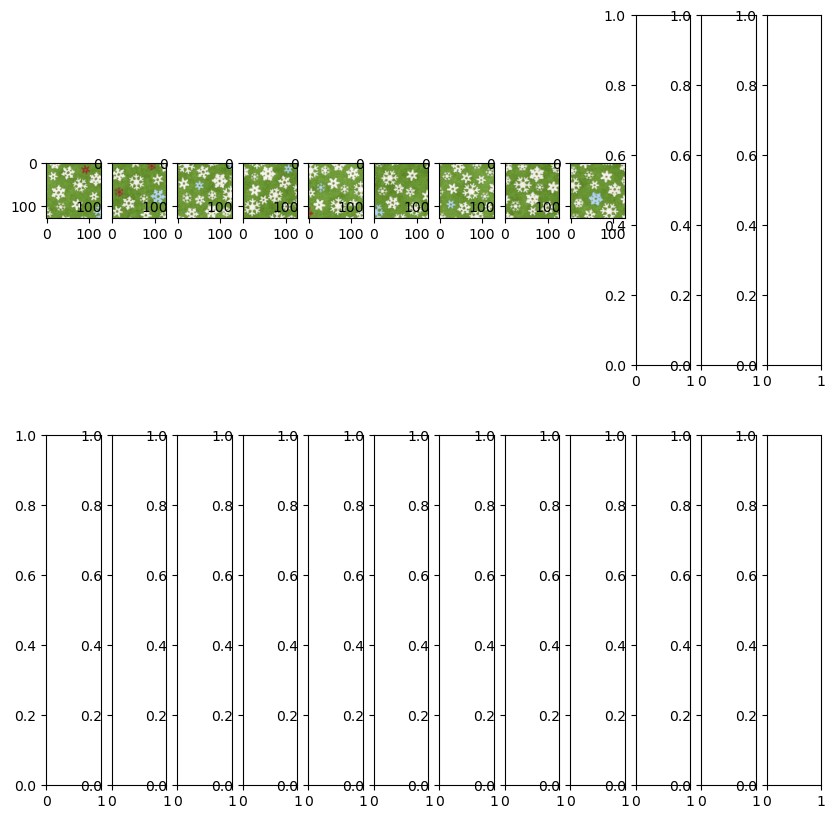

...

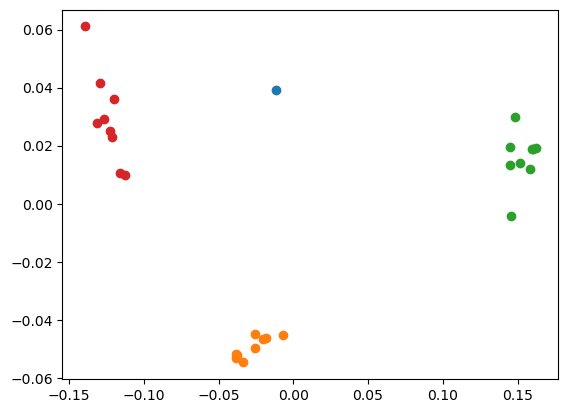

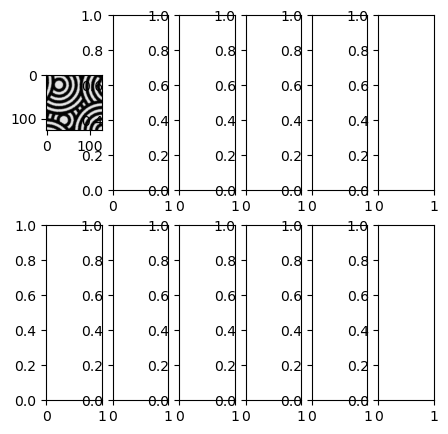

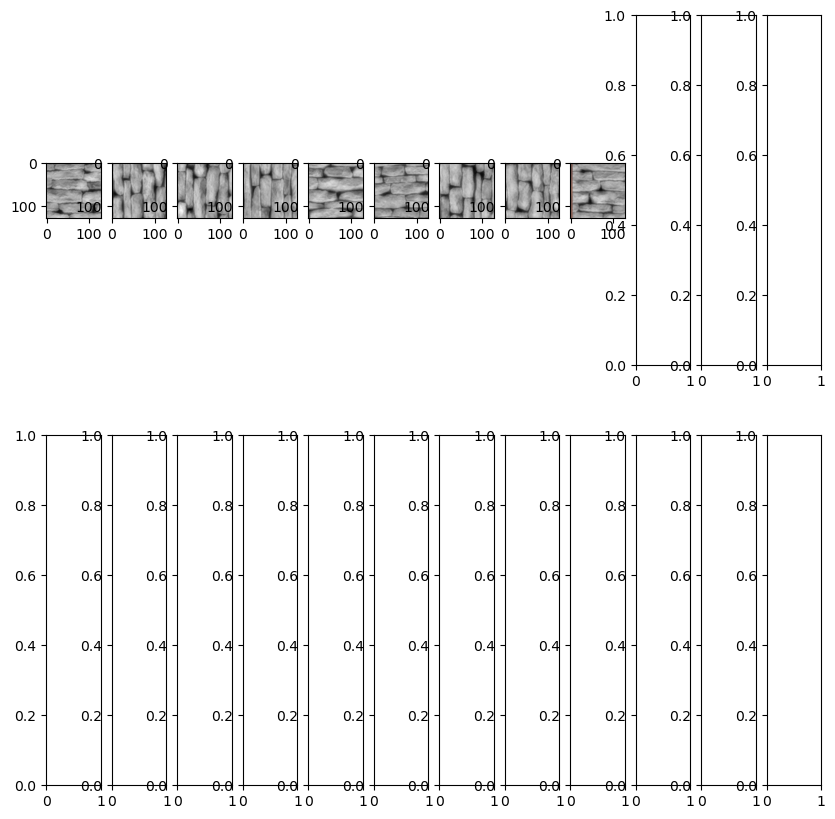

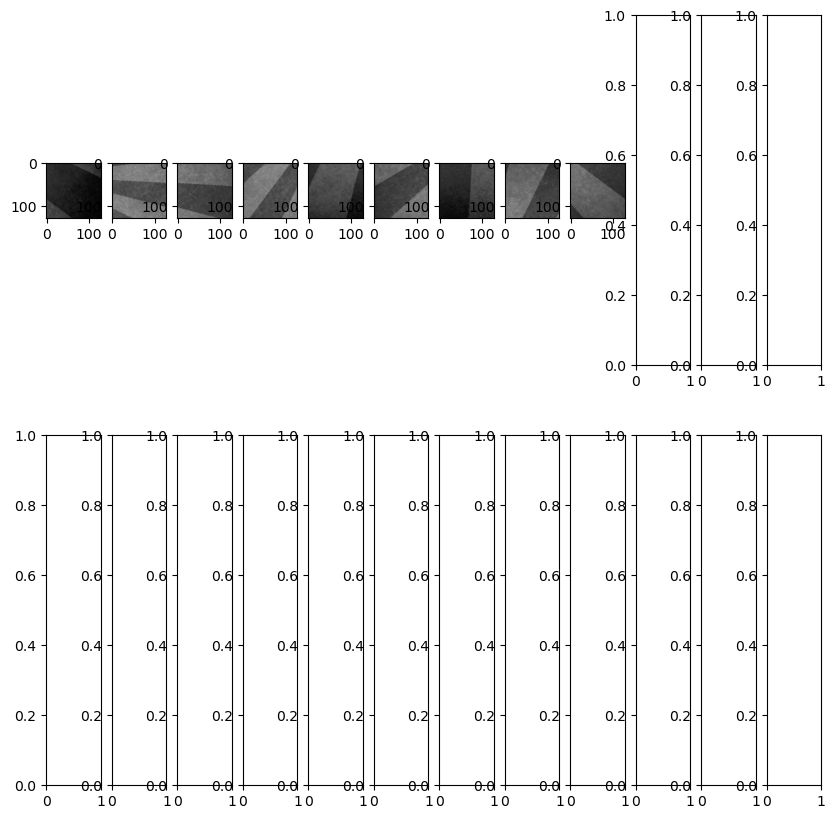

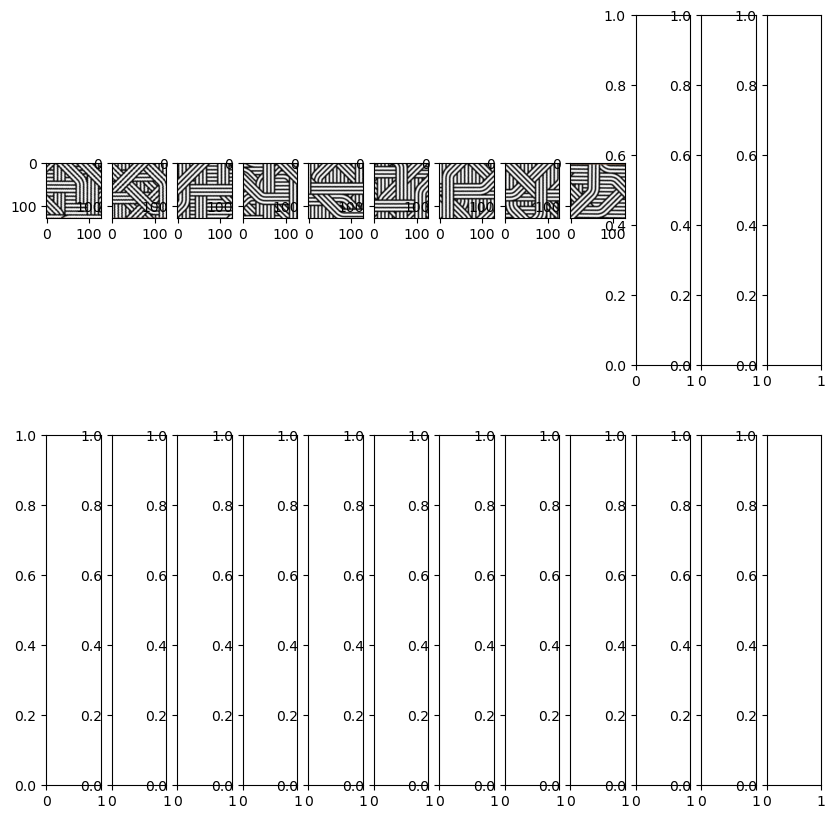

In [20]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)

#list_of_features1=list_of_features[]
for k,features in enumerate(list_of_features):
    pieces=list_of_pieces[k]
    labels=list_of_labels[k]
    principal_components = pca.fit_transform(features)
    plt.figure()
    for i in np.unique(labels):
        plt.scatter(principal_components[labels == i,0], principal_components[labels == i,1])
    plt.show()

    #Show Outliers
    #check if there is a label with value -1
    fig, axs = plt.subplots(2, 6, figsize=(5,5))
    axs = axs.ravel()

    outlier_cluster_solution=[]
    i=0
    for piece in pieces:
        if piece.label == -1:
            axs[i].imshow(piece.data)
            outlier_cluster_solution.append(piece.data)
            i+=1

    #Plot the other Images in Valid Clusters

    #save the cluster to export them at the end
    valid_cluster_solution=[]
    valid_cluster_indiv=[]
    # Create a set of unique values
    valid_cluster_list = set(labels)

    for valid_cluster in valid_cluster_list: 
        if valid_cluster != -1:
            fig, axs = plt.subplots(2, 12, figsize=(10,10))
            axs = axs.ravel()
            i=0
            #print(f"valid cluster {valid_cluster}")
            for piece in pieces:
                if piece.label == valid_cluster:
                    axs[i].imshow(piece.data)
                    i+=1
                    valid_cluster_indiv.append(piece.data)
            valid_cluster_solution.append(valid_cluster_indiv)

    Solutions[k].valid_clusters=valid_cluster_solution
    Solutions[k].outliers=outlier_cluster_solution
        

# Solve tiling puzzle

In [16]:
class Puzzle:
    def __init__(self, pieces):
        if len(pieces) not in [9, 12, 16]:
            raise ValueError(f'Invalid number of pieces, puzzle should be composed of 9, 12 or 16 pieces but got {len(pieces)} pieces.')
        
        self.pieces = pieces
        
        if len(pieces) == 9:
            self.data = np.zeros((384, 384, 3), dtype=pieces[0].data.dtype)
            self.size = (3, 3)
        
        elif len(pieces) == 12:
            self.data = np.zeros((384, 512, 3), dtype=pieces[0].data.dtype)
            self.size = (3, 4)
        
        elif len(pieces) == 16:
            self.data = np.zeros((512, 512, 3), dtype=pieces[0].data.dtype)
            self.size = (4, 4)
    
    def solve(self):
        raise NotImplementedError
    
    def assemble(self):
        for idx, piece in enumerate(self.pieces):
            i = idx // self.size[0]
            j = idx % self.size[1]
            self.data[128*i:128*(i+1), 128*j:128*(j+1), :] = piece.data

In [17]:
from itertools import compress

puzzles = []
outliers = []
for label in np.unique(labels):
    if (labels == label).sum() not in [9, 12, 16]:
        outliers.extend(list(compress(pieces, labels == label)))
    else:
        puzzle = Puzzle(list(compress(pieces, labels == label)))
        puzzles.append(puzzle)

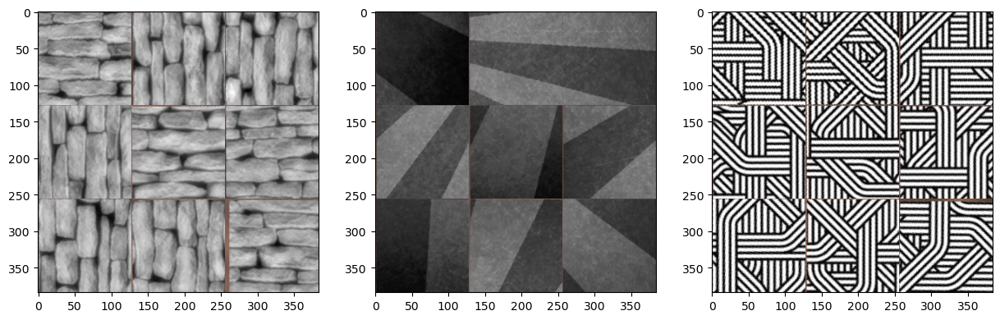

In [18]:
fig, axs = plt.subplots(1, 3, figsize=(15,15))
axs = axs.ravel()

for i, puzzle in enumerate(puzzles):
    puzzle.assemble()
    axs[i].imshow(puzzle.data)